# Conjunto de Dados Públicos de E-Commerce Brasileiro da Olist

## Descrição da empresa e seu problema

A Olist é a maior loja de departamentos nos marketplaces brasileiros, conectando pequenos comerciantes a diversos canais de vendas. A empresa gerencia um grande volume de dados de pedidos, abrangendo várias dimensões como status do pedido, preço, pagamento, desempenho do frete, localização dos clientes, atributos dos produtos e avaliações dos clientes.

Depois que um cliente compra o produto na Olist Store, um vendedor é notificado para atender a esse pedido. Uma vez que o cliente recebe o produto, ou a data de entrega estimada é devida, o cliente recebe uma pesquisa de satisfação por e-mail, onde ele pode dar uma nota para a experiência de compra e escrever alguns comentários.

A Olist enfrenta desafios em compreender as necessidades dos clientes e melhorar continuamente seus serviços e produtos, por isso é necessário uma análise detalhada dos dados para desenvolver estratégias para melhorar a experiência do cliente.

## Descrição do Objetivo da Análise

*   Explorar os dados de pedidos, clientes, produtos e avaliações para identificar padrões e tendências.
*   Determinar fatores que afetam a precificação dos produtos.
*   Propor estratégias de precificação baseadas nos insights obtidos.
*   Fornecer informações e recomendações para a equipe de gestão da Olist tomar decisões informadas sobre precificação e melhoria de experiência do cliente.

## 0. Importações

### 0.1 Bibliotecas

In [ ]:
pip install --upgrade category_encoders

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install -U kaleido

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install pandas plotly

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install geopandas

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Rubeus\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [ ]:
### Manipulação e tratamento de dados
import pandas as pd
import numpy as np
import datetime
from datetime import date
import re
import warnings
import lxml
import inflection

### Visualização de dados
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from PIL import Image
from wordcloud import WordCloud

### Geolocalização e visualização de mapas
import geopandas as gpd
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster, FastMarkerCluster

### Feature Engineering e Pré-processamento
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler, FunctionTransformer
from sklearn.impute import KNNImputer
from sklearn.compose import ColumnTransformer
from category_encoders import TargetEncoder, CatBoostEncoder

### Outras bibliotecas importantes
from collections import Counter
from nltk.corpus import stopwords

In [ ]:
### Ignoring warnings
warnings.filterwarnings('ignore')

### Pandas Settings
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_columns', None)

### Random Seed
SEED = 42

### Palette Seting
custom_palette = ['#001C5B', '#E64E36', '#ff82cd', '#0A4EE4', '#779E3D', '#f0a028']
px.defaults.color_discrete_sequence = custom_palette

### 0.2 Carregando os dados  

In [ ]:
# Carrega os datasets
order_items = pd.read_csv('https://raw.githubusercontent.com/mavimelato/tcc_olist/master/data/olist_order_items_dataset.csv')
orders = pd.read_csv('https://raw.githubusercontent.com/mavimelato/tcc_olist/master/data/olist_orders_dataset.csv')
payments = pd.read_csv('https://raw.githubusercontent.com/mavimelato/tcc_olist/master/data/olist_order_payments_dataset.csv')
products = pd.read_csv('https://raw.githubusercontent.com/mavimelato/tcc_olist/master/data/olist_products_dataset.csv')
customers = pd.read_csv('https://raw.githubusercontent.com/mavimelato/tcc_olist/master/data/olist_customers_dataset.csv')
sellers = pd.read_csv('https://raw.githubusercontent.com/mavimelato/tcc_olist/master/data/olist_sellers_dataset.csv')
product_category = pd.read_csv('https://raw.githubusercontent.com/mavimelato/tcc_olist/master/data/product_category_name_translation.csv')
geolocation = pd.read_csv('https://raw.githubusercontent.com/mavimelato/tcc_olist/master/data/olist_geolocation_dataset.csv')
reviews = pd.read_csv('https://raw.githubusercontent.com/mavimelato/tcc_olist/master/data/olist_order_reviews_dataset.csv')

# Juntando os dados principais do pedido
df = order_items.merge(orders, on='order_id') \
                .merge(payments, on='order_id') \
                .merge(products, on='product_id') \
                .merge(customers, on='customer_id') \
                .merge(sellers, on='seller_id') \
                .merge(product_category, on='product_category_name') \
                .merge(reviews, on='order_id', how='inner')

In [ ]:
#df.to_csv('df_merged.csv', index=False)

## 1. Descrição dos dados

In [ ]:
df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.900,13.290,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,1,credit_card,2,72.190,cool_stuff,58.000,598.000,4.000,650.000,28.000,9.000,14.000,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,27277,volta redonda,SP,cool_stuff,97ca439bc427b48bc1cd7177abe71365,5,NaN,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.900,19.930,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,1,credit_card,3,259.830,pet_shop,56.000,239.000,2.000,30000.000,50.000,30.000,40.000,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,3471,sao paulo,SP,pet_shop,7b07bacd811c4117b742569b04ce3580,4,NaN,NaN,2017-05-13 00:00:00,2017-05-15 11:34:13
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.000,17.870,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,1,credit_card,5,216.870,moveis_decoracao,59.000,695.000,2.000,3050.000,33.000,13.000,33.000,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG,37564,borda da mata,MG,furniture_decor,0c5b33dea94867d1ac402749e5438e8b,5,NaN,Chegou antes do prazo previsto e o produto sur...,2018-01-23 00:00:00,2018-01-23 16:06:31
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.990,12.790,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,1,credit_card,2,25.780,perfumaria,42.000,480.000,1.000,200.000,16.000,10.000,15.000,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP,14403,franca,SP,perfumery,f4028d019cb58564807486a6aaf33817,4,NaN,NaN,2018-08-15 00:00:00,2018-08-15 16:39:01
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.900,18.140,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,1,credit_card,3,218.040,ferramentas_jardim,59.000,409.000,1.000,3750.000,35.000,40.000,30.000,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP,87900,loanda,PR,garden_tools,940144190dcba6351888cafa43f3a3a5,5,NaN,Gostei pois veio no prazo determinado .,2017-03-02 00:00:00,2017-03-03 10:54:59


In [ ]:
geolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.546,-46.639,sao paulo,SP
1,1046,-23.546,-46.645,sao paulo,SP
2,1046,-23.546,-46.643,sao paulo,SP
3,1041,-23.544,-46.639,sao paulo,SP
4,1035,-23.542,-46.642,sao paulo,SP


### 1.1 Dimensão dos dados

In [ ]:
df.shape

(115609, 40)

In [ ]:
geolocation.shape

(1000163, 5)

### 1.2 Colunas

#### 1.2.1 Colunas do Dataset (df)

| Nome da Coluna                   | Descrição                                                                                      |
|----------------------------------|------------------------------------------------------------------------------------------------|
| order_id                         | Identificador único do pedido.                                                                 |
| customer_id                      | Chave para o conjunto de dados dos clientes. Cada pedido tem um customer_id único.            |
| order_status                     | Referência ao status do pedido (entregue, enviado, etc).                                        |
| order_purchase_timestamp         | Mostra o momento da compra.                                                                    |
| order_approved_at                | Mostra o momento da aprovação do pagamento.                                                    |
| order_delivered_carrier_date     | Mostra a data em que o pedido foi encaminhado ao parceiro logístico.                          |
| order_delivered_customer_date    | Mostra a data de entrega real do pedido ao cliente.                                            |
| order_estimated_delivery_date    | Mostra a data de entrega estimada que foi informada ao cliente no momento da compra.           |
| customer_unique_id               | Identificador único de um cliente.                                                             |
| customer_zip_code_prefix         | Os primeiros cinco dígitos do CEP do cliente.                                                  |
| customer_city                    | Nome da cidade do cliente.                                                                     |
| customer_state                   | Estado do cliente.                                                                             |
| order_item_id                    | Número sequencial que identifica o número de itens incluídos no mesmo pedido.                   |
| product_id                       | Identificador único do produto.                                                                |
| seller_id                        | Identificador único do vendedor.                                                               |
| shipping_limit_date              | Mostra a data limite de envio do vendedor para entregar o pedido ao parceiro logístico.        |
| price                            | Preço do item.                                                                                 |
| freight_value                    | Valor do frete do item (se um pedido tiver mais de um item, o valor do frete é dividido).      |
| payment_sequential               | Um cliente pode pagar um pedido com mais de um método de pagamento.                            |
| payment_type                     | Método de pagamento escolhido pelo cliente.                                                     |
| payment_installments             | Número de parcelas escolhidas pelo cliente.                                                     |
| payment_value                    | Valor da transação.                                                                           |
| product_category_name            | Categoria raiz do produto, em português.                                                        |
| product_name_lenght              | Número de caracteres extraídos do nome do produto.                                              |
| product_description_lenght       | Número de caracteres extraídos da descrição do produto.                                         |
| product_photos_qty               | Número de fotos publicadas do produto.                                                          |
| product_weight_g                 | Peso do produto medido em gramas.                                                              |
| product_length_cm                | Comprimento do produto medido em centímetros.                                                   |
| product_height_cm                | Altura do produto medida em centímetros.                                                        |
| product_width_cm                 | Largura do produto medida em centímetros.                                                       |
| seller_zip_code_prefix           | Os primeiros 5 dígitos do CEP do vendedor.                                                      |
| seller_city                      | Nome da cidade do vendedor.                                                                    |
| seller_state                     | Estado do vendedor.                                                                            |
| product_category_name_english    | Nome da categoria em inglês.                                                                   |
| review_id                        | Identificador único da avaliação.                                                               |
| review_score                     | Nota variando de 1 a 5 dada pelo cliente em uma pesquisa de satisfação.                          |
| review_comment_title            | Título do comentário da avaliação deixada pelo cliente, em português.                          |
| review_comment_message          | Mensagem do comentário da avaliação deixada pelo cliente, em português.                        |
| review_creation_date            | Mostra a data em que a pesquisa de satisfação foi enviada ao cliente.                          |
| review_answer_timestamp         | Mostra o momento em que a pesquisa de satisfação foi respondida.                               |

#### 1.2.2 Colunas do Dataset geolocation

| Nome da coluna               | Descrição                                       |
|------------------------------|-------------------------------------------------|
| geolocation_zip_code_prefix  | Os primeiros 5 dígitos do CEP.                  |
| geolocation_lat              | Latitude.                                       |
| geolocation_lng              | Longitude.                                      |
| geolocation_city             | Nome da cidade.                                 |
| geolocation_state            | Estado.                                        |

### 1.3 Tipos dos dados

In [ ]:
# Dataset principal
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115609 entries, 0 to 115608
Data columns (total 40 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       115609 non-null  object 
 1   order_item_id                  115609 non-null  int64  
 2   product_id                     115609 non-null  object 
 3   seller_id                      115609 non-null  object 
 4   shipping_limit_date            115609 non-null  object 
 5   price                          115609 non-null  float64
 6   freight_value                  115609 non-null  float64
 7   customer_id                    115609 non-null  object 
 8   order_status                   115609 non-null  object 
 9   order_purchase_timestamp       115609 non-null  object 
 10  order_approved_at              115595 non-null  object 
 11  order_delivered_carrier_date   114414 non-null  object 
 12  order_delivered_customer_date 

In [ ]:
# Dataset geolocalização
geolocation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


## 2. Pré-processamento de dados

### 2.1 Date Features

In [ ]:
# Colunas com variaveis de data
datetime_columns = ['order_purchase_timestamp',
                    'order_approved_at',
                    'order_delivered_carrier_date',
                    'order_delivered_customer_date',
                    'shipping_limit_date',
                    'review_creation_date',
                    'review_answer_timestamp']

# Convertendo as colunas para datetime, ignorando dados nulos
df[datetime_columns] = df[datetime_columns].apply(pd.to_datetime, errors='coerce')

In [ ]:
# O parametro errors='coerce'  é usado para substituir dados nulos por NaT (not a time)
date_null = df.loc[df['order_delivered_carrier_date'].isnull(), :]
date_null.loc[date_null['order_status'] == 'delivered', :]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
19094,2aa91108853cecb43c84a5dc5b277475,1,44c2baf621113fa7ac95fa06b4afbc68,3f2af2670e104d1bcb54022274daeac5,2017-10-18 10:07:16,179.000,14.980,afeb16c7f46396c0ed54acb45ccaaa40,delivered,2017-09-29 08:52:58,2017-09-29 09:07:16,NaT,2017-11-20 19:44:47,2017-11-14 00:00:00,1,credit_card,1,193.980,moveis_decoracao,54.000,984.000,2.000,7000.000,16.000,50.000,55.000,a2ac81ecc3704410ae240e74d4f0af40,13334,indaiatuba,SP,87240,terra boa,PR,furniture_decor,e945d1831a3d98008913fc31dcbb804d,5,NaN,NaN,2017-10-17,2017-10-17 10:56:02
20422,2d858f451373b04fb5c984a1cc2defaf,1,30b5b5635a79548a48d04162d971848f,f9bbdd976532d50b7816d285a22bd01e,2017-06-04 23:30:16,179.000,15.000,e08caf668d499a6d643dafd7c5cc498a,delivered,2017-05-25 23:22:43,2017-05-25 23:30:16,NaT,NaT,2017-06-23 00:00:00,1,credit_card,4,194.000,esporte_lazer,43.000,1873.000,2.000,900.000,26.000,26.000,26.000,d77cf4be2654aa70ef150f8bfec076a6,91330,porto alegre,RS,5319,sao paulo,SP,sports_leisure,4e755f114e50d33b9ac6a56e0d7d3ea9,5,NaN,NaN,2017-06-25,2017-06-27 01:49:04


* Os valores ausentes em `delivered_customer_date` estão relacionados a pedidos que ainda não foram entregues.

### 2.2 Detalhando as variáveis de data e hora

- Quero calcular a diferença de tempo entre o momento da compra do pedido, o momento da aprovação do pedido e o momento da entrega

In [ ]:
# Tempo entre a aprovação do pedido e a entrega
df['delivery_time'] = df['order_delivered_customer_date'] - df['order_approved_at']

# Convertendo para um formato mais legível (horas)
df['delivery_time_in_hours'] = df['delivery_time'] / pd.Timedelta(hours=1)

- Considerando o momento da compra do pedido, vou criar campos adicionais para analisar tendências sazonais e padrões de comportamento de compra ao longo do ano, semana e dias da semana.

In [ ]:
# Criando novas colunas
df['day']        = df['order_purchase_timestamp'].dt.day # Dia
df['month']      = df['order_purchase_timestamp'].dt.month # Mês
df['year']       = df['order_purchase_timestamp'].dt.year # Ano
df['dayofweek']  = df['order_purchase_timestamp'].dt.dayofweek # Dia da semana
df['weekofyear'] = df['order_purchase_timestamp'].dt.isocalendar().week # Semana do ano

# Coluna apenas com o dia, mês e ano
df['day_month_year'] = df['order_purchase_timestamp'].dt.strftime('%d-%m-%Y')
df['day_month_year'] = pd.to_datetime(df['day_month_year'], format='%d-%m-%Y')

### 2.3 Novas colunas

- Já que a coluna `dayofweek` indica o dia da semana com números de 0 a 6, vou criar uma nova coluna com o nome do dia correspondente para facilitar a interpretação em gráficos e análises visuais.

In [ ]:
# Criando dicionário para dia da semana
mapping = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'}

# Mapping - nome do dia por número
df['name_dayofweek'] = df['dayofweek'].map(mapping)

- Ainda pensando em facilitar a visualização, vou criar colunas de Região.

In [ ]:
# Criar um dicionário para as regiões
mapping = {
    'Norte': ['AC', 'AM', 'AP', 'PA', 'RO', 'RR', 'TO'],
    'Nordeste': ['AL', 'BA', 'CE', 'MA', 'PB', 'PE', 'PI', 'RN', 'SE'],
    'Sudeste': ['ES', 'MG', 'RJ', 'SP'],
    'Centro-Oeste': ['DF', 'GO', 'MS', 'MT'],
    'Sul': ['PR', 'RS', 'SC']}

# Mapeando os estados por região
df['customer_region'] = df['customer_state'].map({state: region for region, states in mapping.items() for state in states})

### 2.4 Descrevendo os dados

In [ ]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
order_item_id,115609.000,1.195,1.000,1.000,1.000,1.000,21.000,0.686
shipping_limit_date,115609,2018-01-06 19:59:37.125777408,2016-09-19 00:15:34,2017-09-19 08:24:41,2018-01-25 19:37:12,2018-05-10 13:50:38,2020-04-09 22:35:08,NaN
price,115609.000,120.620,0.850,39.900,74.900,134.900,6735.000,182.653
freight_value,115609.000,20.057,0.000,13.080,16.320,21.210,409.680,15.836
order_purchase_timestamp,115609,2017-12-31 04:27:50.933335808,2016-09-04 21:15:19,2017-09-12 11:14:11,2018-01-19 03:30:43,2018-05-04 15:56:31,2018-09-03 09:06:57,NaN
order_approved_at,115595,2017-12-31 15:53:50.673195520,2016-10-04 09:43:32,2017-09-12 18:04:35.500000,2018-01-19 14:57:12,2018-05-05 02:13:51,2018-09-03 17:40:06,NaN
order_delivered_carrier_date,114414,2018-01-04 05:48:14.275464704,2016-10-08 10:34:01,2017-09-15 17:37:49,2018-01-23 23:48:29,2018-05-08 13:01:00,2018-09-11 19:48:28,NaN
order_delivered_customer_date,113209,2018-01-13 17:20:24.922400256,2016-10-11 13:46:32,2017-09-25 18:12:25,2018-02-02 01:42:36,2018-05-15 19:54:56,2018-10-17 13:22:46,NaN
payment_sequential,115609.000,1.094,1.000,1.000,1.000,1.000,29.000,0.730
payment_installments,115609.000,2.946,0.000,1.000,2.000,4.000,24.000,2.781


A partir dos resultados do describe, podemos observar alguns insights importantes sobre o conjunto de dados:

- `price:` O preço médio dos produtos é aproximadamente 120 reais, com alta variabilidade (desvio padrão de 184). A maioria dos pedidos (75%) tem preços até 134,90, mas há outliers, como 6735,00.
- `freight_value:` O valor médio do frete é cerca de 20 reais, com alguns pedidos tendo frete grátis (valor de 0) e outros com custos mais elevados, até 409 reais.
- `payment_value:` A média do valor total pago pelos clientes é aproximadamente 173 reais, com casos extremos chegando a 13664 reais.
- `payment_installments:` Em média, os pedidos são parcelados em cerca de 3 vezes, com um máximo de 24 parcelas.
- `review_score:` Média de 4.034, indicando que as avaliações dos clientes são, em média, positivas.
- `delivery_time` O tempo médio de entrega é de 12 dias.

### 2.5 Verificando valores nulos

In [ ]:
# Criando um dicionário para armazenar as contagens de valores nulos e porcentagens
null_info = {'Coluna': [], 'Valores Nulos': [], '% de Nulos': []}

# Iterando sobre as colunas do DataFrame
for col in df.columns:
    null_count = df[col].isna().sum()
    null_percentage = (null_count / len(df)) * 100

    # Adicionando os dados ao dicionário
    null_info['Coluna'].append(col)
    null_info['Valores Nulos'].append(null_count)
    null_info['% de Nulos'].append(null_percentage)

# Criando um DataFrame com os resultados
null_values = pd.DataFrame(null_info)

# Ordenando os valores nulos em ordem decrescente
null_values = null_values.sort_values(by='Valores Nulos', ascending=False)

# Exibindo os valores nulos
print(null_values)

                           Coluna  Valores Nulos  % de Nulos
36           review_comment_title         101808      88.062
37         review_comment_message          66703      57.697
40                  delivery_time           2414       2.088
41         delivery_time_in_hours           2414       2.088
12  order_delivered_customer_date           2400       2.076
11   order_delivered_carrier_date           1195       1.034
10              order_approved_at             14       0.012
25               product_width_cm              1       0.001
22               product_weight_g              1       0.001
23              product_length_cm              1       0.001
24              product_height_cm              1       0.001
32                   seller_state              0       0.000
31                    seller_city              0       0.000
30         seller_zip_code_prefix              0       0.000
34                      review_id              0       0.000
35                   rev

- `review_comment_title` (88.06%) e `review_comment_message` (57.70%) têm um percentual muito alto de valores nulos. Isso indica que muitos pedidos não têm comentários ou que esses campos não foram preenchidos pelos clientes.

- O restante dos dados possui um percentual médio de 2% de dados nulos, o que não é um número muito alto.

### 2.6 Dados categóricos

- Mostrando os atributos categóricos no conjunto de dados e quantos valores únicos cada um possui.

In [ ]:
# Selecionando atributos categóricos
cat_attributes = df.select_dtypes(include=['object'])

# Contagem de valores únicos
unique_counts = cat_attributes.nunique()

# Exibindo os resultados
print(unique_counts)

order_id                         96516
product_id                       32171
seller_id                         3028
customer_id                      96516
order_status                         7
order_estimated_delivery_date      449
payment_type                         4
product_category_name               71
customer_unique_id               93396
customer_city                     4093
customer_state                      27
seller_city                        604
seller_state                        23
product_category_name_english       71
review_id                        96319
review_comment_title              4477
review_comment_message           35176
name_dayofweek                       7
customer_region                      5
dtype: int64


In [ ]:
# Exibindo os valores únicos de 'payment_type'
print('Tipos de pagamentos:')
print(df.payment_type.unique())
print()

# Exibindo os valores únicos de 'order_status'
print('Status:')
print(df.order_status.unique())
print()

# Exibindo os valores únicos de 'product_category'
print('Categorias:')
print(df.product_category_name.unique())
print()

Tipos de pagamentos:
['credit_card' 'boleto' 'voucher' 'debit_card']

Status:
['delivered' 'shipped' 'canceled' 'invoiced' 'processing' 'approved'
 'unavailable']

Categorias:
['cool_stuff' 'pet_shop' 'moveis_decoracao' 'perfumaria'
 'ferramentas_jardim' 'utilidades_domesticas' 'telefonia' 'beleza_saude'
 'livros_tecnicos' 'fashion_bolsas_e_acessorios' 'cama_mesa_banho'
 'esporte_lazer' 'consoles_games' 'moveis_escritorio' 'malas_acessorios'
 'alimentos' 'agro_industria_e_comercio' 'eletronicos'
 'informatica_acessorios' 'construcao_ferramentas_construcao' 'audio'
 'bebes' 'construcao_ferramentas_iluminacao' 'brinquedos' 'papelaria'
 'industria_comercio_e_negocios' 'relogios_presentes' 'automotivo'
 'eletrodomesticos' 'moveis_cozinha_area_de_servico_jantar_e_jardim'
 'climatizacao' 'casa_conforto' 'telefonia_fixa'
 'portateis_casa_forno_e_cafe' 'fraldas_higiene' 'sinalizacao_e_seguranca'
 'instrumentos_musicais' 'eletroportateis' 'construcao_ferramentas_jardim'
 'artes' 'casa_construca

In [ ]:
df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delivery_time,delivery_time_in_hours,day,month,year,dayofweek,weekofyear,day_month_year,name_dayofweek,customer_region
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.900,13.290,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,1,credit_card,2,72.190,cool_stuff,58.000,598.000,4.000,650.000,28.000,9.000,14.000,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,27277,volta redonda,SP,cool_stuff,97ca439bc427b48bc1cd7177abe71365,5,NaN,"Perfeito, produto entregue antes do combinado.",2017-09-21,2017-09-22 10:57:03,7 days 13:58:13,181.970,13,9,2017,2,37,2017-09-13,Wednesday,Sudeste
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.900,19.930,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,1,credit_card,3,259.830,pet_shop,56.000,239.000,2.000,30000.000,50.000,30.000,40.000,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,3471,sao paulo,SP,pet_shop,7b07bacd811c4117b742569b04ce3580,4,NaN,NaN,2017-05-13,2017-05-15 11:34:13,16 days 04:59:11,388.986,26,4,2017,2,17,2017-04-26,Wednesday,Sudeste
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.000,17.870,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,1,credit_card,5,216.870,moveis_decoracao,59.000,695.000,2.000,3050.000,33.000,13.000,33.000,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG,37564,borda da mata,MG,furniture_decor,0c5b33dea94867d1ac402749e5438e8b,5,NaN,Chegou antes do prazo previsto e o produto sur...,2018-01-23,2018-01-23 16:06:31,7 days 22:30:46,190.513,14,1,2018,6,2,2018-01-14,Sunday,Sudeste
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.990,12.790,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,1,credit_card,2,25.780,perfumaria,42.000,480.000,1.000,200.000,16.000,10.000,15.000,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP,14403,franca,SP,perfumery,f4028d019cb58564807486a6aaf33817,4,NaN,NaN,2018-08-15,2018-08-15 16:39:01,6 days 03:22:21,147.373,8,8,2018,2,32,2018-08-08,Wednesday,Sudeste
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.900,18.140,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,1,credit_card,3,218.040,ferramentas_jardim,59.000,409.000,1.000,3750.000,35.000,40.000,30.000,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP,87900,loanda,PR,garden_tools,940144190dcba6351888cafa43f3a3a5,5,NaN,Gostei pois veio no prazo determinado .,2017-03-02,2017-03-03 10:54:59,25 days 02:32:18,602.538,4,2,2017,5,5,2017-02-04,Saturday,Sudeste


In [ ]:
#df.to_csv('df_preprocessed.csv', index=False)

## 3. Análise Explatória de Dados (EDA)

### 3.1 Análise dos pedidos

#### 3.1.1 Como o número de pedidos muda ao longo do tempo? Qual dia teve o maior número de pedidos?

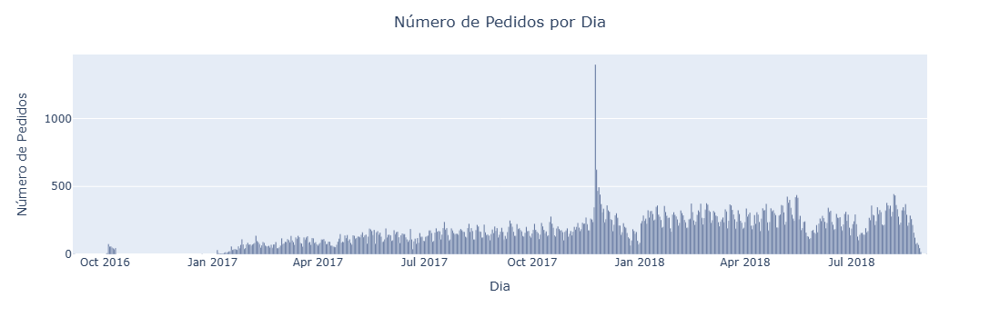

In [ ]:
# Manipulação de Dados - Criando um DataFrame agrupado
df_aux = df[['day_month_year', 'order_id']].groupby(['day_month_year']).count().reset_index()

# Criando o gráfico interativo
fig_teste = px.bar(df_aux, x='day_month_year', y='order_id')

# Personalizando o gráfico usando Plotly
fig_teste.update_layout(
    title='Número de Pedidos por Dia',       # Título do gráfico
    xaxis_title='Dia',                        # Rótulo do eixo X
    yaxis_title='Número de Pedidos',          # Rótulo do eixo Y
    title_x=0.5                               # Centraliza o título do gráfico
)

# Exibindo o gráfico interativo
fig_teste.show()

# Salvando o gráfico como uma imagem PNG
fig_teste.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_teste.png', width=1200, height=1200, scale=3)

* O maior número de pedidos foi em novembro de 2017. Esse dia foi a Black Friday daquele ano, que é um dos dias de maior venda do ano.

#### 3.1.2 Como o número de pedidos varia por região? Existe alguma região que tenha mais pedidos em um determinado período?

In [ ]:
# Manipulação de Dados - Criando um dataframe agrupado
df_aux = df[['day_month_year', 'order_id', 'customer_region']].groupby(['day_month_year', 'customer_region']).count().reset_index()

# Selecionando dados de 2018
df_aux = df_aux.loc[df_aux['day_month_year'] >= '2018-01-01']

fig_12 = px.line(df_aux, x='day_month_year', y='order_id', color='customer_region', title='Número de Pedidos por Dia e por Região')
fig_12.update_layout(
    xaxis_title='Dia',
    yaxis_title='Número de Pedidos',
    title_x=0.5
)

# Exibindo a figura interativa
fig_12.show()

# Salvando o gráfico como uma imagem PNG
fig_12.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_12.png', width=1200, height=700, scale=3)

* O gráfico contém apenas os dados de 2018. O número de pedidos é maior na região Sudeste ao longo de todo o ano e não há uma diferença significativa em seus valores ao longo do tempo.

* O número de pedidos aumenta e diminui, mas a proporção de pedidos entre as regiões é quase a mesma.

#### 3.1.3 Números de pedidos por tipo de pagamento

In [ ]:
# Manipulação de Dados - Criando um DataFrame agrupado
df_aux = df[['payment_type', 'order_id']].groupby(['payment_type']).count().reset_index()
df_aux.sort_values('order_id', ascending=False, inplace=True)

# Criando o gráfico interativo
fig_13 = px.bar(df_aux, x='payment_type', y='order_id', text_auto=True, color='payment_type')

# Personalizando o gráfico
fig_13.update_layout(
    title='Número de Pedidos por Tipo de Pagamento',  # Título do gráfico
    xaxis_title='Tipo de Pagamento',                  # Rótulo do eixo X
    yaxis_title='Número de Pedidos',                  # Rótulo do eixo Y
    title_x=0.5,                                     # Centraliza o título do gráfico
    xaxis_tickangle=-45                             # Inclina os rótulos do eixo X para melhor leitura
)

# Exibindo o gráfico interativo
fig_13.show()

# Salvando o gráfico como uma imagem PNG
fig_13.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_13.png', width=1200, height=600, scale=3)

* O Cartão de Crédito é o tipo de pagamento mais utilizado no conjunto de dados. Em segundo lugar, o boleto, representa cerca de 1/4 do volume de pagamentos com cartão de crédito. O Vale é o terceiro, e o Cartão de Débito é o quarto.

#### 3.1.4 Como é a distribuição semanal dos pedidos não entregues?

In [ ]:
# Manipulação de Dados - Criando um DataFrame agrupado
df_aux = df.loc[(df['day_month_year'] >= '2018-01-01') & (df['order_status'] != 'delivered'), :]
df_aux = df_aux[['weekofyear', 'order_id', 'order_status']].groupby(['weekofyear', 'order_status']).count().reset_index()

# Criando o gráfico interativo
fig_14 = px.bar(df_aux, x='weekofyear', y='order_id', color='order_status',
                 title='Número de Pedidos Não Entregues por Semana (2018)',  # Título do gráfico
                 labels={'weekofyear': 'Semana', 'order_id': 'Número de Pedidos'})  # Rótulos dos eixos

# Personalizando o gráfico
fig_14.update_layout(
    title='Número de Pedidos Não Entregues por Semana (2018)',  # Título do gráfico
    xaxis_title='Semana',                                      # Rótulo do eixo X
    yaxis_title='Número de Pedidos',                            # Rótulo do eixo Y
    title_x=0.5                                             # Centraliza o título do gráfico
)

# Salvando a imagem
fig_14.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_14.png', width=1200, height=600, scale=3)

# Exibindo o gráfico interativo
fig_14.show()

* Juntando o número de pedidos por semana, podemos ver que o número de pedidos cancelados tem um pico na semana 4 até a semana 9, e outro pico por volta da 30ª semana.

* A pergunta é: isso é um padrão anual?

In [ ]:
# Manipulação de Dados - Criando um DataFrame agrupado
df_aux = df.loc[(df['day_month_year'] >= '2017-01-01') & (df['day_month_year'] <= '2017-12-31') & (df['order_status'] != 'delivered'), :]
df_aux = df_aux[['weekofyear', 'order_id', 'order_status']].groupby(['weekofyear', 'order_status']).count().reset_index()

# Criando o gráfico interativo
fig_141 = px.bar(df_aux, x='weekofyear', y='order_id', color='order_status',
                 title='Número de Pedidos Não Entregues por Semana (2017)',  # Título do gráfico
                 labels={'weekofyear': 'Semana', 'order_id': 'Número de Pedidos'})  # Rótulos dos eixos

# Personalizando o gráfico
fig_141.update_layout(
    title='Número de Pedidos Não Entregues por Semana (2017)',  # Título do gráfico
    xaxis_title='Semana',                                      # Rótulo do eixo X
    yaxis_title='Número de Pedidos',                            # Rótulo do eixo Y
    title_x=0.5                                             # Centraliza o título do gráfico
)

# Salvando a imagem (opcional)
fig_141.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_141.png', width=1200, height=600, scale=3)

# Exibindo o gráfico interativo
fig_141.show()

* Não conseguimos observar um padrão anual nos pedidos cancelados como em 2018. Mas, assim como em 2018, o número de pedidos cancelados é maior na 30ª a 33ª semana.

#### 3.1.5 Números de pedidos por categoria

In [ ]:
df_aux1 = df[['product_category_name', 'order_id']].groupby(['product_category_name']).count().reset_index()
df_aux1 = df_aux1.sort_values('order_id', ascending=False).head(20)

fig_21 = px.bar(df_aux1, x='product_category_name', y='order_id', text_auto=True)
fig_21.update_layout(
    title='Número de Pedidos por Categoria',
    xaxis_title='Categoria',
    yaxis_title='Número de Pedidos'
)

# Salvar o primeiro gráfico como imagem
fig_21.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_21.png', width=1200, height=600, scale=3)

# Exibir o primeiro gráfico
fig_21.show()

* A categoria mais vendida é **cama, mesa e banho**, seguida por **beleza e saúde**, **esporte e lazer**, **móveis de decoração** e **informática e acessórios**.

* As categorias menos vendidas são **seguros e serviços**, **fashion roupa infanto-juvenil**, **PC gamer**, **CDs DVDs musicais** e **portáteis de cozinha**.

* Podemos dizer que um e-commerce não é o melhor lugar para vender seguros e que CDs e DVDs não vendem tanto quanto costumavam.

#### 3.1.6 Números de pedidos por estado

In [ ]:
# Manipulação de Dados - Criando um DataFrame agrupado
df_aux = df[['customer_state', 'order_id']].groupby(['customer_state']).count().reset_index()
df_aux.sort_values('order_id', ascending=False, inplace=True)

# Criando o gráfico interativo
fig_16 = px.bar(df_aux, x='customer_state', y='order_id', text='order_id',
                 title='Número de Pedidos por Estado',  # Título do gráfico
                 labels={'customer_state': 'Estado', 'order_id': 'Número de Pedidos'})  # Rótulos dos eixos

# Personalizando o gráfico
fig_16.update_layout(
    title='Número de Pedidos por Estado',  # Título do gráfico
    xaxis_title='Estado',                  # Rótulo do eixo X
    yaxis_title='Número de Pedidos',        # Rótulo do eixo Y
    height=600,                            # Altura do gráfico
    width=1000,                            # Largura do gráfico
    xaxis_title_font_size=14,              # Tamanho da fonte do título do eixo X
    yaxis_title_font_size=14,              # Tamanho da fonte do título do eixo Y
    title_x=0.5,                           # Centraliza o título do gráfico
    xaxis_tickangle=-45                    # Inclina os rótulos do eixo X para melhor visualização
)

# Salvando a imagem (opcional)
fig_16.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_16.png', width=1200, height=600, scale=3)

# Exibindo o gráfico interativo
fig_16.show()

* São Paulo é o maior comprador (muito a frente dos demais). O segundo e o terceiro lugares também são da Região Sudeste, mas não são tão grandes quanto SP em número de pedidos.

* No último lugar estão os Estados do Norte do país, qusãoão bastante distantes dos centros logísticos.

#### 3.1.7 Os clientes compram mais no começo do mês?

In [ ]:
# Manipulação de Dados
df_aux = df[['order_id', 'day']].groupby(['day']).count().reset_index()
df_aux.sort_values('order_id', ascending=False, inplace=True)

# Criando o gráfico de barras
fig_17 = px.bar(df_aux, x='day', y='order_id', text_auto=True,
                title='Número de Pedidos por Dia do Mês',
                labels={'day': 'Dia', 'order_id': 'Número de Pedidos'},
                color='order_id', color_continuous_scale='magma')

# Personalizando o layout do gráfico
fig_17.update_layout(
    title_x=0.5,                       # Centraliza o título
    xaxis_title='Dia do Mês',          # Rótulo do eixo X
    yaxis_title='Número de Pedidos',   # Rótulo do eixo Y
    xaxis=dict(tickmode='linear'),     # Define o modo de ticks do eixo X para linear
    yaxis=dict(title='Número de Pedidos'),  # Define o título do eixo Y
    xaxis_tickangle=-45                # Inclina os rótulos do eixo X para melhor legibilidade
)

# Salvando o gráfico como uma imagem PNG
fig_17.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_17.png', width=1200, height=600, scale=3)

# Exibindo o gráfico interativo
fig_17.show()

* Não tem um padrão de compra para falar que os consumidores compram mais no começo do mês, mas há uma queda no número de pedidos a partir do 28° dia.

#### 3.1.8 Número de Pedidos por Dia da Semana

In [ ]:
df_aux1 = df[['order_id', 'name_dayofweek']].groupby(['name_dayofweek']).count().reset_index()
df_aux1.sort_values('order_id', ascending=False, inplace=True)

fig_18 = px.bar(df_aux1, x='name_dayofweek', y='order_id', text_auto=True, color='name_dayofweek',
                         labels={'name_dayofweek': 'Dia da Semana', 'order_id': 'Número de Pedidos'})
fig_18.update_layout(
    title='Número de Pedidos por Dia da Semana',
    xaxis_title='Dia da Semana',
    yaxis_title='Número de Pedidos'
)

# Salvar o primeiro gráfico como imagem
fig_18.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_18.png', width=800, height=400, scale=3)

# Exibir o primeiro gráfico
fig_18.show()

#### 3.1.9 Valor Médio de Pagamento por Dia da Semana

In [ ]:
df_aux2 = df[['payment_value', 'name_dayofweek']].groupby(['name_dayofweek']).mean().reset_index()
df_aux2.sort_values('payment_value', ascending=False, inplace=True)

fig_19 = px.bar(df_aux2, x='name_dayofweek', y='payment_value', text_auto=True, color='name_dayofweek',
                        labels={'name_dayofweek': 'Dia da Semana', 'payment_value': 'Valor Médio do Pagamento'})
fig_19.update_layout(
    title='Valor Médio de Pagamento por Dia da Semana',
    xaxis_title='Dia da Semana',
    yaxis_title='Valor Médio do Pagamento'
)

# Salvar o segundo gráfico como imagem
fig_19.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_19.png', width=1200, height=400, scale=3)

# Exibir o segundo gráfico
fig_19.show()

* No primeiro gráfico, o dia com o maior número de pedidos é a segunda-feira, mas não é o dia com o maior valor médio de pagamento.

* No segundo gráfico, o dia com o maior valor médio de pagamento é a sexta-feira, que ocupa a quinta posição em número de pedidos. As pessoas podem estar mais propensas a gastar mais às sextas-feiras do que em outros dias, ou pode ser que a Black Friday de 2017 esteja influenciando os números.

* O fim de semana tem o menor número de pedidos e o menor valor médio de pagamento. As pessoas não gastam muito online durante os fins de semana.

In [ ]:
# Cria dados de ponto representativo a partir do código postal dos dados geográficos
geo_data = pd.DataFrame(dict(rep_lat=geolocation.groupby("geolocation_zip_code_prefix").geolocation_lat.mean(),
                                rep_long=geolocation.groupby("geolocation_zip_code_prefix").geolocation_lng.mean())).reset_index()

# Mesclar os dados de geolocalização nos dados de clientes
geo_customers = customers.merge(geo_data, left_on="customer_zip_code_prefix", right_on="geolocation_zip_code_prefix")

In [ ]:
# Verificar quantas linhas foram removidas
print("{} linhas foram perdidas. Correspondente a {:.1f}% das linhas.".format(len(customers)-len(geo_customers), (len(customers)-len(geo_customers))/len(geo_customers)*100))
geo_customers.head(10)

278 linhas foram perdidas. Correspondente a 0.3% das linhas.


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,rep_lat,rep_long
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,14409,-20.498,-47.397
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,9790,-23.728,-46.543
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,1151,-23.532,-46.656
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,8775,-23.500,-46.185
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,13056,-22.975,-47.143
5,879864dab9bc3047522c92c82e1212b8,4c93744516667ad3b8f1fb645a3116a4,89254,jaragua do sul,SC,89254,-26.471,-49.116
6,fd826e7cf63160e536e0908c76c3f441,addec96d2e059c80c30fe6871d30d177,4534,sao paulo,SP,4534,-23.584,-46.674
7,5e274e7a0c3809e14aba7ad5aae0d407,57b2a98a409812fe9618067b6b8ebe4f,35182,timoteo,MG,35182,-19.576,-42.643
8,5adf08e34b2e993982a47070956c5c65,1175e95fb47ddff9de6b2b06188f7e0d,81560,curitiba,PR,81560,-25.487,-49.218
9,4b7139f34592b3a31687243a302fa75b,9afe194fb833f79e300e37e580171f22,30575,belo horizonte,MG,30575,-19.974,-43.973


In [ ]:
# Verificando quais linhas foram removidas de customers
missing_data = customers[~customers.customer_zip_code_prefix.isin(geo_customers.customer_zip_code_prefix.values)]
missing_data

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
354,ecb1725b26e8b8c458181455dfa434ea,b55a113bb84fc10eaf58c6d09ec69794,72300,brasilia,DF
382,bcf86029aeed4ed8bac0e16eb14c22f5,7cd7974c9f79f75b77f323878ef87f43,11547,cubatao,SP
877,f4302056f0c58570522590f8181de2c7,67b05b597a66b5c449025000b9430abb,64605,picos,PI
1218,03bbe0ce5c28e05f22917607db798818,8f3dca4306d5a89e4ae2c65c110603a2,72465,brasilia,DF
1272,ad4950aded55c2ea376be59506456d68,aa2b96dd03307ea6dc4b763c0b5f0b39,7729,caieiras,SP
...,...,...,...,...,...
97467,cf818420383856a129134f5f8343f7b8,795c495a65f983b242fb01bd507977c5,72338,brasilia,DF
97780,67f3e907dce402e696b15f9308ff22ed,6f232f2f5c7f33b7bd9d794d2afacadd,68629,paragominas,PA
98140,f792e419335df11d82c32efcfb09c51b,c04c085b8e7573ba87b9ae1968d0985e,28530,sao sebastiao do paraiba,RJ
98878,78a11bb1fa72f556996b9a5b9bcd0629,e7536f62a200b415edd9491ac12a17fa,55863,siriji,PE


In [ ]:
# Verificando se os códigos realmente não estavam em geolocation
geolocation.geolocation_zip_code_prefix.isin(missing_data.customer_zip_code_prefix.values)

0          False
1          False
2          False
3          False
4          False
           ...  
1000158    False
1000159    False
1000160    False
1000161    False
1000162    False
Name: geolocation_zip_code_prefix, Length: 1000163, dtype: bool

In [ ]:
# Focar em customer_unique_id porque customer_id é distribuído por pedido
grouped_geo_customers = geo_customers.groupby("customer_unique_id")[["rep_lat", "rep_long"]].mean().reset_index()
grouped_geo_customers.head()

,customer_unique_id,rep_lat,rep_long
0,0000366f3b9a7992bf8c76cfdf3221e2,-23.340,-46.830
1,0000b849f77a49e4a4ce2b2a4ca5be3f,-23.559,-46.788
2,0000f46a3911fa3c0805444483337064,-27.543,-48.633
3,0000f6ccb0745a6a4b88665a16c9f078,-1.312,-48.483
4,0004aac84e0df4da2b147fca70cf8255,-23.506,-47.470


#### 3.1.10 Quais são as 5 cidades com mais pedidos?

In [ ]:
# Manipulação dos dados
top_5_cities = df['customer_city'].value_counts().head(5).reset_index()
top_5_cities.columns = ['Cidade', 'Número de Pedidos']

# Gráfico
fig_52 = px.bar(top_5_cities, x='Cidade', y='Número de Pedidos',
                 title='Top 5 Cidades com Mais Pedidos',
                 labels={'Cidade': 'Cidade', 'Número de Pedidos': 'Número de Pedidos'},
                 color='Cidade')

# Atualizando layout
fig_52.update_layout(
    xaxis_title='Cidade',
    yaxis_title='Número de Pedidos',
    width=800,  # Definindo a largura do gráfico
    height=400,  # Definindo a altura do gráfico
    margin=dict(l=20, r=20, t=40, b=20)  # Ajustando as margens
)

# Mostrando o gráfico
fig_52.show()

# Salvando o gráfico como uma imagem PNG
fig_52.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_52.png', width=1200, height=600, scale=3)

### 3.3 Análise dos preços

#### 3.3.1 Como é a distribuição dos preços nas 10 categorias de produtos mais vendidas?

In [ ]:
# Manipulação de Dados - Agrupando por categoria de produto
df_aux1 = df[['product_category_name', 'order_id']].groupby(['product_category_name']).count().reset_index()
df_aux1.sort_values('order_id', ascending=False, inplace=True)

# Selecionando as 30 categorias mais vendidas
most_sold_categories = df_aux1.product_category_name.head(10).tolist()
df_aux2 = df[df['product_category_name'].isin(most_sold_categories)]

# Criando o gráfico de caixa (box plot) com uma paleta de cores categórica
fig_31 = px.box(df_aux2, x='product_category_name', y='price',
                 title='Distribuição de Preços nas 10 Categorias Mais Vendidas',
                 labels={'product_category_name': 'Categoria', 'price': 'Preço'},
                 color='product_category_name',
                 color_discrete_sequence=px.colors.qualitative.Plotly)  # Aplicando uma paleta de cores categóricas

# Personalizando o layout do gráfico
fig_31.update_layout(
    title_x=0.5,                   # Centraliza o título
    xaxis_title='Categoria',       # Rótulo do eixo X
    yaxis_title='Preço',           # Rótulo do eixo Y
    xaxis_showgrid=False,          # Remove a grade do eixo X
    yaxis=dict(title='Preço'),     # Define o título do eixo Y
    xaxis_tickangle=-45,           # Inclina os rótulos do eixo X para melhor legibilidade
    height=600,                    # Aumenta a altura do gráfico
    margin=dict(l=40, r=40, t=80, b=150),  # Ajusta as margens para dar mais espaço aos rótulos
    xaxis_tickfont_size=10         # Diminui o tamanho da fonte dos rótulos do eixo X
)

# Exibindo o gráfico interativo
fig_31.show()

# Salvando o gráfico como uma imagem PNG
fig_31.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_31.png', width=1200, height=600, scale=3)

In [ ]:
# Calculando estatísticas para as 10 categorias mais vendidas
stats_table = df_aux2.groupby('product_category_name').agg(
    num_pedidos=('price', 'count'),
    preco_min=('price', 'min'),
    preco_max=('price', 'max'),
    preco_medio=('price', 'mean'),
    mediana=('price', 'median')
).reset_index()

# Formatando os valores numéricos
stats_table['preco_medio'] = stats_table['preco_medio'].round(2)
stats_table['mediana'] = stats_table['mediana'].round(2)

# Ordenando a tabela pelo número de pedidos (num_pedidos) em ordem decrescente
stats_table = stats_table.sort_values(by='num_pedidos', ascending=False).reset_index(drop=True)

# Melhorando a exibição da tabela
stats_table_styled = stats_table.style.format({
    'preco_min': 'R${:,.2f}',
    'preco_max': 'R${:,.2f}',
    'preco_medio': 'R${:,.2f}',
    'mediana': 'R${:,.2f}'
}).set_table_styles([
    {'selector': 'thead th', 'props': [('text-align', 'center'), ('font-weight', 'bold'), ('background-color', '#001c5b'), ('color', '#ffffff')]},
    {'selector': 'tbody td', 'props': [('text-align', 'center')]},
]).set_caption('Tabela 1: Estatísticas das 10 Categorias Mais Vendidas')

# Exibindo a tabela no Jupyter Notebook
stats_table_styled

,product_category_name,num_pedidos,preco_min,preco_max,preco_medio,mediana
0,cama_mesa_banho,11847,R$6.99,"R$1,999.98",R$92.49,R$78.99
1,beleza_saude,9944,R$1.20,"R$3,124.00",R$129.82,R$79.90
2,esporte_lazer,8942,R$4.50,"R$4,059.00",R$114.35,R$76.24
3,moveis_decoracao,8743,R$4.90,"R$1,899.00",R$87.54,R$65.00
4,informatica_acessorios,8105,R$3.90,"R$3,699.99",R$116.59,R$81.50
5,utilidades_domesticas,7331,R$3.06,"R$6,735.00",R$90.61,R$59.54
6,relogios_presentes,6161,R$8.99,"R$3,999.90",R$202.20,R$129.00
7,telefonia,4692,R$5.00,"R$2,428.00",R$71.57,R$29.99
8,ferramentas_jardim,4558,R$6.35,"R$3,930.00",R$113.20,R$59.90
9,automotivo,4356,R$3.49,"R$2,258.00",R$139.79,R$84.72


#### 3.3.2 Qual é a distribuição dos preços nas 10 categorias de produtos mais vendidas, considerando apenas os produtos com preço abaixo de R$1.000?

In [ ]:
# Manipulação de Dados - Agrupando por categoria de produto
df_aux1 = df[['product_category_name', 'order_id']].groupby(['product_category_name']).count().reset_index()
df_aux1.sort_values('order_id', ascending=False, inplace=True)

# Selecionando as 30 categorias mais vendidas e preços abaixo de R$1.000
most_sold_categories = df_aux1.product_category_name.head(10).tolist()
df_aux2 = df[(df['product_category_name'].isin(most_sold_categories)) & (df['price'] <= 1000)]

# Criando o gráfico de caixa (box plot)
fig_32 = px.box(df_aux2, x='product_category_name', y='price',
                 title='Distribuição de Preços nas 30 Categorias Mais Vendidas (Abaixo de R$1.000)',
                 labels={'product_category_name': 'Categoria', 'price': 'Preço'},
                 color='product_category_name',
                 color_discrete_sequence=px.colors.qualitative.Plotly)

# Personalizando o layout do gráfico
fig_32.update_layout(
    title_x=0.5,                   # Centraliza o título
    xaxis_title='Categoria',       # Rótulo do eixo X
    yaxis_title='Preço',           # Rótulo do eixo Y
    xaxis_showgrid=False,          # Remove a grade do eixo X
    xaxis_tickangle=-45,           # Inclina os rótulos do eixo X para melhor legibilidade
    height=650                     # Define a altura do gráfico
)

# Exibindo o gráfico interativo
fig_32.show()

# Salvando o gráfico como uma imagem PNG
fig_32.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_32.png', width=1200, height=600, scale=3)

* Podemos concluir que a maioria dos produtos nas 30 principais categorias estão sendo vendidos por menos de R$250.

#### 3.3.3 Como varia o preço médio dos produtos entre os diferentes estados e regiões do Brasil?

In [ ]:
# Manipulação de Dados - Criando o dataframe agrupado
df_aux = df[['customer_state', 'price', 'customer_region']].groupby(['customer_state', 'customer_region']).mean().reset_index()
df_aux.sort_values('price', ascending=False, inplace=True)

# Criando o gráfico de barras
fig_33 = px.bar(df_aux, x='customer_state', y='price', color='customer_region', text_auto=True,
                title='Preço Médio dos Produtos por Estado e Região',
                labels={'customer_state': 'Estado', 'price': 'Preço Médio', 'customer_region': 'Região'})

# Personalizando o layout do gráfico
fig_33.update_layout(
    title_x=0.5,                   # Centraliza o título
    xaxis_title='Estado',          # Rótulo do eixo X
    yaxis_title='Preço Médio',     # Rótulo do eixo Y
    xaxis_showgrid=False,          # Remove a grade do eixo X
    yaxis=dict(title='Preço Médio'), # Define o título do eixo Y
)

# Exibindo o gráfico interativo
fig_33.show()

# Salvando o gráfico como uma imagem PNG
fig_33.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_33.png', width=1200, height=800, scale=3)

* Estados do Norte e Nordeste têm o maior preço médio. Esses estados pagam mais por produto e compram em menor quantidade, como observado anteriormente.
  
* Estados do Sul e Sudeste têm o menor preço médio. Esses estados pagam menos por produto e compram em maior quantidade, também observado anteriormente.

#### 3.3.4 Qual é a diferença no preço médio do frete entre os estados e como isso varia por região?

In [ ]:
# Manipulação de Dados - Criando o dataframe agrupado
df_aux = df[['customer_state', 'freight_value', 'customer_region']].groupby(['customer_state', 'customer_region']).mean().reset_index()
df_aux.sort_values('freight_value', ascending=False, inplace=True)

# Criando o gráfico de barras
fig_34 = px.bar(df_aux, x='customer_state', y='freight_value', color='customer_region', text_auto=True,
                title='Preço Médio do Frete por Estado e Região',
                labels={'customer_state': 'Estado', 'freight_value': 'Preço Médio do Frete', 'customer_region': 'Região'})

# Personalizando o layout do gráfico
fig_34.update_layout(
    title_x=0.5,                   # Centraliza o título
    xaxis_title='Estado',          # Rótulo do eixo X
    yaxis_title='Preço Médio do Frete',  # Rótulo do eixo Y
    xaxis_showgrid=False,          # Remove a grade do eixo X
    yaxis=dict(title='Preço Médio do Frete'), # Define o título do eixo Y
)

# Exibindo o gráfico interativo
fig_34.show()

# Salvando o gráfico como uma imagem PNG
fig_34.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_34.png', width=1200, height=600, scale=3)

* Além do alto preço dos produtos, os estados do Norte e Nordeste também possuem o maior preço médio para frete. Esses estados enfrentam desafios logísticos que podem aumentar o custo do frete.

* O menor preço de frete está no estado de São Paulo, possivelmente devido à sua infraestrutura logística bem desenvolvida, ao contrário dos estados menos populosos.

### 3.4 Análise dos reviews

#### 3.4.1 Quais categorias de produtos apresentam as melhores e piores avaliações?

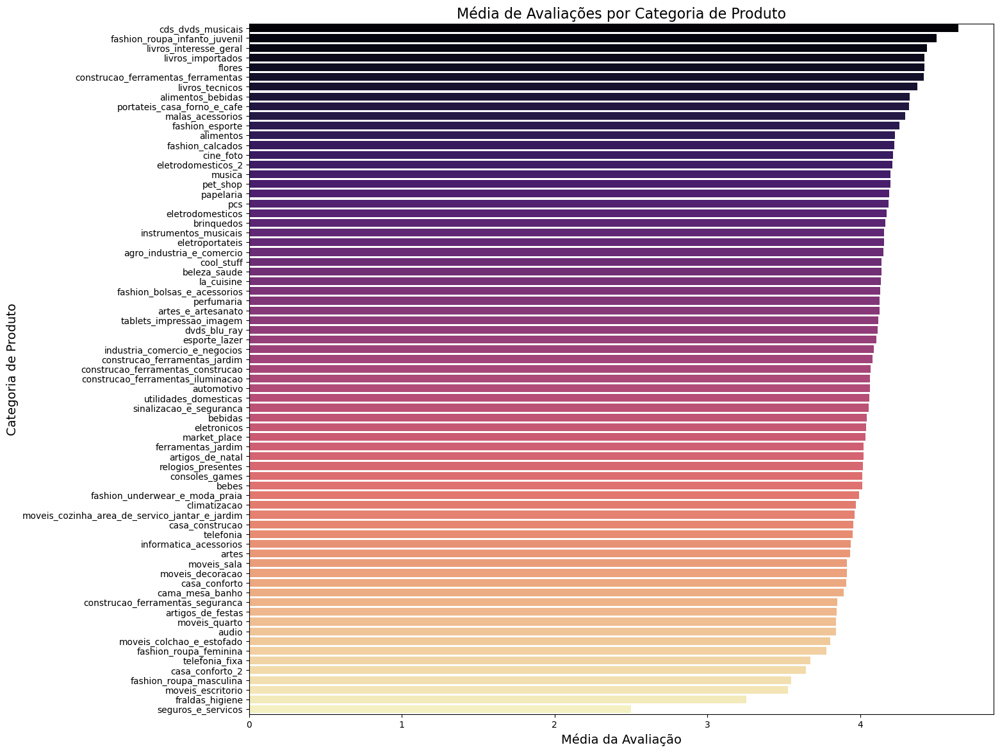

In [ ]:
category_reviews = df.groupby('product_category_name')['review_score'].mean().reset_index()

# Ordenando os resultados pela média das avaliações
category_reviews = category_reviews.sort_values(by='review_score', ascending=False)

# Visualizando as médias das avaliações
plt.figure(figsize=(15, 14))
sns.barplot(x='review_score', y='product_category_name', data=category_reviews, palette='magma')
plt.title('Média de Avaliações por Categoria de Produto', fontsize=16)
plt.xlabel('Média da Avaliação', fontsize=14)
plt.ylabel('Categoria de Produto', fontsize=14)

# Salvando o gráfico como PNG
plt.savefig('C:/Users/Rubeus/Documents/tcc/images/figura_41.png', dpi=300, bbox_inches='tight')

# Exibindo o gráfico
plt.show()

#### 3.4.2 Como a pontuação média da avaliação dos produtos se relaciona com o tempo de entrega em diferentes regiões?

* Tem releção entre o Review Score e o tempo de entrega por região?

In [ ]:
# Manipulação de Dados
df_aux = df[['review_score', 'payment_value', 'customer_state', 'customer_region', 'delivery_time_in_hours']].groupby(['customer_state', 'customer_region']).mean().reset_index()

# Criando o gráfico
fig_44 = px.scatter(df_aux, x='delivery_time_in_hours', y='review_score', color='customer_region', size='payment_value',
                    trendline='ols', trendline_scope='overall', trendline_color_override='black',
                    title='Pontuação Média da Avaliação vs. Delta de Tempo (Regiões)',
                    labels={'delivery_time_in_hours': 'Tempo de entrega (horas)', 'review_score': 'Pontuação da Avaliação'})

# Customizando o gráfico
fig_44.update_layout(
    title='Pontuação Média da Avaliação vs. Tempo de entrega (Regiões)',
    xaxis_title='Tempo de entrega (horas)',
    yaxis_title='Pontuação da Avaliação',
    height=650
)

# Mostrando o gráfico
fig_44.show()

# Salvando o gráfico como uma imagem PNG
fig_44.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_44.png', width=1200, height=600, scale=3)

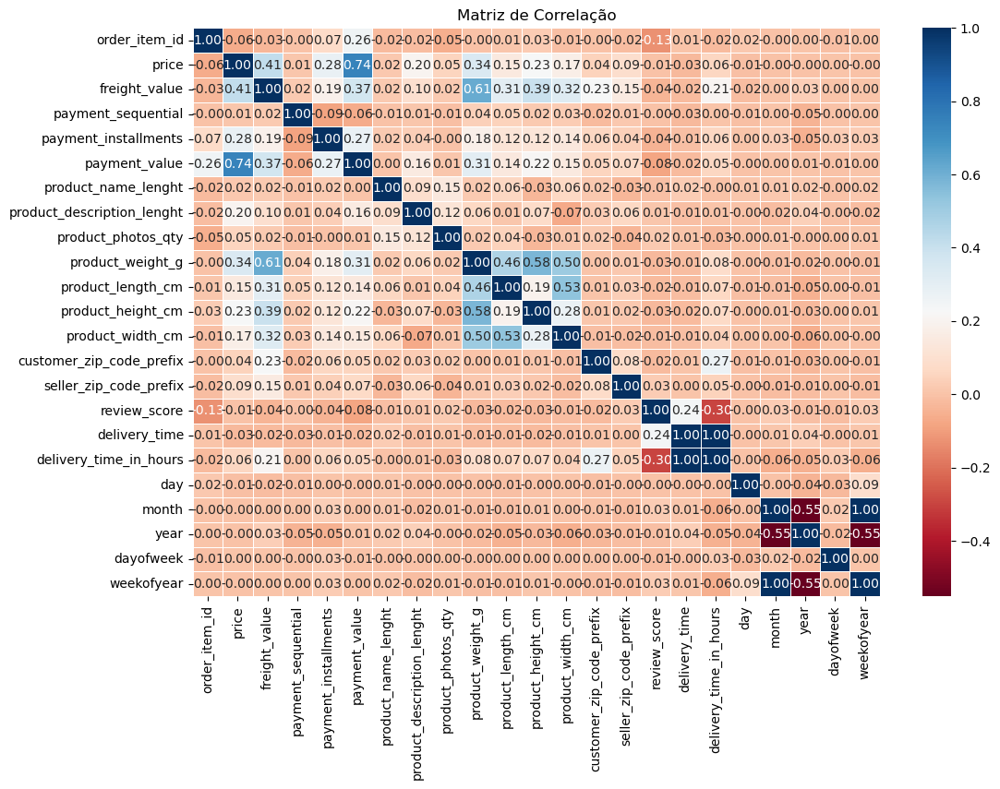

In [ ]:
# Selecionando apenas as colunas numéricas
df_numerico = df.select_dtypes(include=['number'])

# Calculando a matriz de correlação
correlation_matrix = df_numerico.corr()

# Criando o mapa de calor
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlação')

# Salvando a imagem na pasta especificada
plt.savefig('C:/Users/Rubeus/Documents/tcc/images/matriz_correlacao.png', bbox_inches='tight')

# Exibindo a imagem
plt.show()

#### 3.4.5 Qual é a relação entre a pontuação média de avaliação dos clientes e o tempo de entrega dos produtos em diferentes estados?

In [ ]:
# Manipulação de Dados - Criando o DataFrame agrupado
df_aux = df[['review_score', 'payment_value', 'customer_state', 'delivery_time_in_hours']].groupby(['customer_state']).mean().reset_index()

# Criando o gráfico
fig_45 = px.scatter(df_aux, x='delivery_time_in_hours', y='review_score', color='customer_state', size='payment_value',
                    trendline='ols', trendline_scope='overall', trendline_color_override='black',
                    title='Pontuação Média da Avaliação vs. Delta de Tempo (Estados)',
                    labels={'delivery_time_in_hours': 'Tempo de entrega (horas)', 'review_score': 'Pontuação da Avaliação'})

# Customizando o gráfico
fig_45.update_layout(
    title='Pontuação Média da Avaliação vs. Tempo de entrega (Estados)',
    xaxis_title='Tempo de entrega (horas)',
    yaxis_title='Pontuação da Avaliação',
    height=650
)

# Mostrando o gráfico
fig_45.show()

# Salvando o gráfico como uma imagem PNG
fig_45.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_45.png', width=1200, height=600, scale=3)

* São Paulo é o estado com o menor tempo de entrega (199), mas não é o que possui a maior média de pontuação (4,11).

* Por outro lado, temos Amapá com o segundo maior tempo de entrega (656) e a maior média de pontuação (4,23).

* No entanto, Roraima tem a menor média de pontuação (3,58) para o maior tempo de entrega (667).

* De maneira geral, é possível observar que há uma relação negativa entre as duas variáveis, e pode-se afirmar que quanto maior o tempo de entrega, menor é a média de pontuação.

#### 3.4.6 Qual é a distribuição das avaliações dos clientes do e-commerce?

In [ ]:
print("review_score == 5: %d" % len(df[df['review_score']==5]))
print("review_score == 4: %d" % len(df[df['review_score']==4]))
print("review_score == 3: %d" % len(df[df['review_score']==3]))
print("review_score == 2: %d" % len(df[df['review_score']==2]))
print("review_score == 1: %d" % len(df[df['review_score']==1]))
score_list = [len(df[df['review_score']==1]),
              len(df[df['review_score']==2]),
              len(df[df['review_score']==3]),
              len(df[df['review_score']==4]),
              len(df[df['review_score']==5])]

review_score == 5: 65374
review_score == 4: 21951
review_score == 3: 9718
review_score == 2: 4020
review_score == 1: 14546


In [ ]:
# Definindo as cores
colors = ['#001C5B', '#E64E36', '#ff82cd', '#0A4EE4', '#779E3D', '#f0a028']

# Criando o gráfico de barras no Plotly
fig_47 = go.Figure(data=[go.Bar(
    x=[1, 2, 3, 4, 5],
    y=score_list,
    marker_color=colors,
    text=score_list,  # Adiciona os rótulos com os valores de quantidade
    textposition='inside',  # Coloca os rótulos dentro das barras
)])

# Configurações do gráfico
fig_47.update_layout(
    title="Distribuição das avaliações",
    xaxis_title="Pontuação da Avaliação",
    yaxis_title="Quantidade",
    width=1100,
    height=600
)

# Exibindo o gráfico
fig_47.show()

# Salvando o gráfico como uma imagem PNG
fig_47.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_47.png', width=1100, height=600, scale=3)

### 4.0 Quais são as métricas e KPIs importantes do e-commerce  

Uma métrica é qualquer medição quantificável e padronizada do desempenho de um site. KPI, ou indicador-chave de desempenho, refere-se a métricas essenciais para monitoramento. Embora todas as métricas tenham seu valor, os KPIs são especialmente relevantes, pois são os números que você acompanha para promover o crescimento. Nem todas as métricas de e-commerce têm o mesmo peso, mas identificar os KPIs corretos é crucial para melhorar o desempenho da loja virtual.

In [ ]:
col = ['customer_unique_id', 'price', 'order_item_id', 'order_purchase_timestamp']
orders = df[col]

In [ ]:
orders

,customer_unique_id,price,order_item_id,order_purchase_timestamp
0,871766c5855e863f6eccc05f988b23cb,58.900,1,2017-09-13 08:59:02
1,eb28e67c4c0b83846050ddfb8a35d051,239.900,1,2017-04-26 10:53:06
2,3818d81c6709e39d06b2738a8d3a2474,199.000,1,2018-01-14 14:33:31
3,af861d436cfc08b2c2ddefd0ba074622,12.990,1,2018-08-08 10:00:35
4,64b576fb70d441e8f1b2d7d446e483c5,199.900,1,2017-02-04 13:57:51
...,...,...,...,...
115604,0c9aeda10a71f369396d0c04dce13a64,299.990,1,2018-04-23 13:57:06
115605,0da9fe112eae0c74d3ba1fe16de0988b,350.000,1,2018-07-14 10:26:46
115606,cd79b407828f02fdbba457111c38e4c4,99.900,1,2017-10-23 17:07:56
115607,eb803377c9315b564bdedad672039306,55.990,1,2017-08-14 23:02:59


In [ ]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])

orders['InvoiceYearMonth'] = orders['order_purchase_timestamp'].map(lambda date: 100*date.year + date.month)

'''
InvoiceYearMonth representa a data combinada em ano e mês,
facilitando a análise de dados de vendas por períodos mensais.
'''

orders['Revenue'] = orders['price'] * orders['order_item_id']
orders_revenue = orders.groupby(['InvoiceYearMonth'])['Revenue'].sum().reset_index()
orders.head()

,customer_unique_id,price,order_item_id,order_purchase_timestamp,InvoiceYearMonth,Revenue
0,871766c5855e863f6eccc05f988b23cb,58.900,1,2017-09-13 08:59:02,201709,58.900
1,eb28e67c4c0b83846050ddfb8a35d051,239.900,1,2017-04-26 10:53:06,201704,239.900
2,3818d81c6709e39d06b2738a8d3a2474,199.000,1,2018-01-14 14:33:31,201801,199.000
3,af861d436cfc08b2c2ddefd0ba074622,12.990,1,2018-08-08 10:00:35,201808,12.990
4,64b576fb70d441e8f1b2d7d446e483c5,199.900,1,2017-02-04 13:57:51,201702,199.900


#### 4.1 Receita Recorrente Mensal (MRR)

É a quantia que uma empresa espera receber mensalmente em pagamentos. O MRR é uma métrica de receita crucial para empresas de assinatura, pois permite avaliar a saúde financeira geral do negócio, monitorando de perto o fluxo de caixa mensal.

In [ ]:
plot_data = [
    go.Scatter(
        x=orders_revenue['InvoiceYearMonth'],  # Eixo X: Mês e Ano
        y=orders_revenue['Revenue'],  # Eixo Y: Receita
        mode = 'lines+markers'  # Exibe tanto as linhas quanto os marcadores
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},  # Eixo X será categórico (ex.: meses)
        title='Receita Mensal', width=900, height=500  # Configurações do layout: título, largura e altura
    )
fig_401 = go.Figure(data=plot_data, layout=plot_layout)
fig_401.show()  # Exibe o gráfico

# Salvando o gráfico como uma imagem PNG
fig_401.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_401.png', width=1200, height=600, scale=3)

- A variação muito alta na receita no final de 2018 e 2016 chamou a atenção, o que motivou a análise mais detalhada desses períodos. Para entender melhor o motivo dessa flutuação, vou gerar uma tabela mostrando a quantidade de registros de transações feitas nesses meses.

- O objetivo é verificar se essa variação se deve à falta de dados ou se há outra explicação, como uma mudança no comportamento de compras ou eventos específicos. Essa análise ajudará a identificar se os dados são consistentes e fornecerá insights sobre o desempenho real do e-commerce nesses períodos.

In [ ]:
# Verificando a contagem de registros por mês
orders['InvoiceYearMonth'] = pd.to_datetime(orders['InvoiceYearMonth'], format='%Y%m')
orders_count = orders.groupby(orders['InvoiceYearMonth'].dt.to_period('M')).size().reset_index(name='Registros')

# Renomeando as colunas para uma exibição mais clara
orders_count.columns = ['InvoiceYearMonth', 'Registros']

# Criando a tabela como uma imagem usando plotly
fig_table = go.Figure(go.Table(
    header=dict(values=['InvoiceYearMonth', 'Registros']),
    cells=dict(values=[orders_count['InvoiceYearMonth'].astype(str), orders_count['Registros']])
))

# Exibindo a tabela
fig_table.show()

#### 4.2 Taxa de Crescimento Mensal  

A taxa de crescimento mês a mês (MoM) é a menor unidade de medida usada para capturar de forma objetiva o ritmo de crescimento de uma empresa. Esse indicador pode ser expandido para acompanhar o crescimento trimestre a trimestre e ano a ano, fornecendo uma visão das taxas de crescimento ao longo de diferentes períodos de tempo. Ele é mais comumente utilizado por empresas em estágio inicial para realizar projeções.

In [ ]:
# usando a função pct_change() para ver a variação percentual mensal
orders_revenue['MonthlyGrowth'] = orders_revenue['Revenue'].pct_change()

'''
A função pct_change() no Pandas calcula a variação percentual entre os valores consecutivos de uma coluna de um DataFrame.
Essencialmente, ela mostra quanto o valor atual mudou em relação ao valor anterior, como uma porcentagem.
'''

# exibindo as primeiras 10 linhas
orders_revenue.head(10)

,InvoiceYearMonth,Revenue,MonthlyGrowth
0,201609,165.290,NaN
1,201610,56639.420,341.667
2,201612,10.900,-1.000
3,201701,149027.760,13671.272
4,201702,273722.290,0.837
5,201703,424866.990,0.552
6,201704,418201.880,-0.016
7,201705,590306.400,0.412
8,201706,486664.960,-0.176
9,201707,591273.640,0.215


In [ ]:
plot_data = [
    go.Scatter(
        # Usando o método query para filtrar as datas posteriores a janeiro de 2017 como eixo X
        x=orders_revenue.query("InvoiceYearMonth > 201701")['InvoiceYearMonth'],

        # Filtrando o crescimento mensal (MonthlyGrowth) após janeiro de 2017 para o eixo Y
        y=orders_revenue.query("InvoiceYearMonth > 201701")['MonthlyGrowth'],

        # Definindo o gráfico como um gráfico de linha com marcadores
        mode = 'lines+markers'
    )
]

plot_layout = go.Layout(
        # Definindo o eixo X como categórico

        xaxis={"type": "category"},

        title='Taxa de Crescimento Mensal', width=1000, height=500
    )
# Criando a figura combinando os dados do gráfico e o layout
fig_402 = go.Figure(data=plot_data, layout=plot_layout)

# Exibindo o gráfico
fig_402.show()

# Salvando o gráfico como uma imagem PNG
fig_402.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_402.png', width=1200, height=600, scale=3)

In [ ]:
# Convertendo a coluna 'InvoiceYearMonth' para string (caso não esteja nesse formato)
orders_revenue['InvoiceYearMonth'] = orders_revenue['InvoiceYearMonth'].astype(str)

# Filtrando os dados onde o 'InvoiceYearMonth' é maior que '201701'
monthly_growth_table = orders_revenue[orders_revenue['InvoiceYearMonth'] > '201701'][['InvoiceYearMonth', 'MonthlyGrowth']]

# Exibindo a tabela em formato legível
print("Tabela de Taxa de Crescimento Mensal (MoM):")
print(monthly_growth_table.to_string(index=False))

# Se preferir salvar a tabela em um arquivo de texto:
monthly_growth_table.to_csv('C:/Users/Rubeus/Documents/tcc/images/fig_402_tabela.txt', index=False, sep='\t')

Tabela de Taxa de Crescimento Mensal (MoM):
InvoiceYearMonth  MonthlyGrowth
          201702          0.837
          201703          0.552
          201704         -0.016
          201705          0.412
          201706         -0.176
          201707          0.215
          201708          0.122
          201709          0.187
          201710         -0.019
          201711          0.550
          201712         -0.319
          201801          0.327
          201802         -0.076
          201803          0.127
          201804          0.021
          201805          0.011
          201806         -0.123
          201807          0.010
          201808         -0.059
          201809         -1.000


* Nos primeiros meses de 2017, a taxa de crescimento permaneceu acima de 40% até maio, com exceção de abril.

* Houve uma queda semelhante na taxa de crescimento em junho de 2017, após a qual a taxa de crescimento permaneceu em torno de 15-20% até setembro.
  
* Em novembro, houve um aumento, seguido por uma queda brusca em dezembro, após a qual a taxa de crescimento permaneceu em torno de 0%.

#### 4.3 Clientes Ativos Mensais

Clientes Ativos Mensais (MAU) é uma métrica de marketing usada para determinar o número de usuários únicos que visitam um site ou utilizam um app em um mês.

Monitorar os MAUs é importante, pois fornece insights sobre o número de usuários que se envolvem ativamente com um produto ou serviço, ajudando as empresas a medir e melhorar o engajamento e a retenção de clientes.

Os MAUs podem servir como um KPI, permitindo que as empresas meçam o sucesso de seus esforços de marketing e estratégias de desenvolvimento de produtos. Ao analisar as mudanças nos MAUs ao longo do tempo, as empresas identificam tendências e tomam decisões baseadas em dados.

*Usamos Clientes Ativos Mensais, pois temos os dados dos clientes que realizam transações (comparado a usuários que apenas acessam a plataforma).*

In [ ]:
# criando um dataframe de clientes ativos mensais contando os Customer IDs únicos
orders_monthly_active = orders.groupby('InvoiceYearMonth')['customer_unique_id'].nunique().reset_index()

orders_monthly_active.head()

,InvoiceYearMonth,customer_unique_id
0,2016-09-01,2
1,2016-10-01,298
2,2016-12-01,1
3,2017-01-01,735
4,2017-02-01,1648


In [ ]:
plot_data = [
    go.Bar(
        x=orders_monthly_active['InvoiceYearMonth'],
        y=orders_monthly_active['customer_unique_id'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Clientes Ativos Mensais', width=900, height=500
    )

fig_403 = go.Figure(data=plot_data, layout=plot_layout)
fig_403.show()

# Salvando o gráfico como uma imagem PNG
fig_403.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_403.png', width=1200, height=600, scale=3)

* O número de clientes ativos mensais apresentou um crescimento constante de dezembro de 2016 até novembro de 2017, mas depois permaneceu quase estagnado até agosto de 2018.

#### 4.4 Pedidos Mensais

Aqui estamos medindo o número total de pedidos em cada mês. Se tivéssemos os dados de pedidos cancelados, poderíamos calcular a taxa de atendimento, que é uma métrica importante para avaliar a qualidade dos pedidos feitos, além de identificar problemas de precificação, entrega e outros relacionados.

*Nota: Para a análise, considerei que todos os pedidos foram entregues.*

In [ ]:
# criar um novo dataframe para o número de pedidos utilizando o campo 'quantidade'
orders_monthly_sales = orders.groupby('InvoiceYearMonth')['order_item_id'].sum().reset_index()

# imprimir o dataframe
orders_monthly_sales.head()

# plotar o gráfico
plot_data = [
    go.Bar(
        x=orders_monthly_sales['InvoiceYearMonth'],  # eixo X: mês e ano da fatura
        y=orders_monthly_sales['order_item_id'],  # eixo Y: número total de itens do pedido
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},  # tipo do eixo X definido como categoria
        title='Número Total de Pedidos por Mês',  # título do gráfico
        width=900,  # largura do gráfico
        height=500  # altura do gráfico
    )

fig_404 = go.Figure(data=plot_data, layout=plot_layout)  # cria a figura com os dados e o layout do gráfico
fig_404.show()  # exibe o gráfico

# Salvando o gráfico como uma imagem PNG
fig_404.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_404.png', width=1200, height=600, scale=3)

* A quantidade total de pedidos por mês mostrou um crescimento entre dezembro de 2016 e novembro de 2017, mas depois permaneceu praticamente estável até agosto de 2018.

In [ ]:
# criar um novo DataFrame para a receita média, calculando a média
orders_monthly_order_avg = orders.groupby('InvoiceYearMonth')['Revenue'].mean().reset_index()

orders_monthly_order_avg.head()

,InvoiceYearMonth,Revenue
0,2016-09-01,55.097
1,2016-10-01,150.237
2,2016-12-01,10.900
3,2017-01-01,149.326
4,2017-02-01,136.930


In [ ]:
# plotar o gráfico de barras
plot_data = [
    go.Bar(
        x=orders_monthly_order_avg['InvoiceYearMonth'],
        y=orders_monthly_order_avg['Revenue'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Valores Médios de Pedidos Mensais', width=900, height=500
    )
fig_405 = go.Figure(data=plot_data, layout=plot_layout)
fig_405.show()

# Salvando o gráfico como uma imagem PNG
fig_405.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_405.png', width=1200, height=600, scale=3)

* Com exceção de dezembro de 2016, os valores médios dos pedidos ficaram praticamente estáveis em torno de 130. Isso sugere que o comportamento de compra dos clientes não mudou muito, e os itens mais caros na plataforma não influenciaram de forma significativa nas vendas ou no valor médio dos pedidos.

#### 4.6 Clientes Novos vs. Clientes Existentes

In [ ]:
# Cria um DataFrame contendo o ID do cliente e a data da primeira compra
orders_min_purchase = orders.groupby('customer_unique_id').order_purchase_timestamp.min().reset_index()
orders_min_purchase.columns = ['customer_unique_id','MinPurchaseDate']
orders_min_purchase['MinPurchaseYearMonth'] = orders_min_purchase['MinPurchaseDate'].map(lambda date: 100*date.year + date.month)

# Mescla a coluna da primeira data de compra com nosso DataFrame principal
orders = pd.merge(orders, orders_min_purchase, on='customer_unique_id')

In [ ]:
orders.head()

,customer_unique_id,price,order_item_id,order_purchase_timestamp,InvoiceYearMonth,Revenue,MinPurchaseDate,MinPurchaseYearMonth
0,871766c5855e863f6eccc05f988b23cb,58.900,1,2017-09-13 08:59:02,2017-09-01,58.900,2017-09-13 08:59:02,201709
1,eb28e67c4c0b83846050ddfb8a35d051,239.900,1,2017-04-26 10:53:06,2017-04-01,239.900,2017-04-26 10:53:06,201704
2,3818d81c6709e39d06b2738a8d3a2474,199.000,1,2018-01-14 14:33:31,2018-01-01,199.000,2018-01-14 14:33:31,201801
3,af861d436cfc08b2c2ddefd0ba074622,12.990,1,2018-08-08 10:00:35,2018-08-01,12.990,2018-08-08 10:00:35,201808
4,64b576fb70d441e8f1b2d7d446e483c5,199.900,1,2017-02-04 13:57:51,2017-02-01,199.900,2017-02-04 13:57:51,201702


In [ ]:
import pandas as pd

# Supondo que 'orders' já esteja carregado com os dados fornecidos

# Passo 1: Garantir que as colunas de data estejam corretamente formatadas
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])

# Passo 2: Criar a coluna InvoiceYearMonth com ano e mês das compras
orders['InvoiceYearMonth'] = orders['order_purchase_timestamp'].dt.to_period('M')

# Passo 3: Identificar a primeira compra de cada cliente
# Vamos usar a coluna 'MinPurchaseDate' e garantir que seja a primeira compra de cada cliente
orders_min_purchase = orders.groupby('customer_unique_id')['MinPurchaseDate'].min().reset_index()
orders_min_purchase.columns = ['customer_unique_id', 'FirstPurchaseDate']

# Passo 4: Extrair o mês e ano da primeira compra para comparar com o mês e ano da compra atual
orders_min_purchase['FirstPurchaseYearMonth'] = orders_min_purchase['FirstPurchaseDate'].dt.to_period('M')

# Passo 5: Mesclar a data da primeira compra com o DataFrame original
orders = pd.merge(orders, orders_min_purchase[['customer_unique_id', 'FirstPurchaseYearMonth']], on='customer_unique_id', how='left')

# Passo 6: Classificar os clientes como "New" ou "Existing"
orders['UserType'] = 'Existing'  # Inicialmente, marcamos todos como 'Existing'
orders.loc[orders['InvoiceYearMonth'] == orders['FirstPurchaseYearMonth'], 'UserType'] = 'New'

# Passo 7: Exibir os resultados
# Mostrar uma amostra do DataFrame com a classificação de novos e existentes
print(orders[['customer_unique_id', 'order_purchase_timestamp', 'InvoiceYearMonth', 'FirstPurchaseYearMonth', 'UserType']].head())


                 customer_unique_id order_purchase_timestamp InvoiceYearMonth  \
0  871766c5855e863f6eccc05f988b23cb      2017-09-13 08:59:02          2017-09   
1  eb28e67c4c0b83846050ddfb8a35d051      2017-04-26 10:53:06          2017-04   
2  3818d81c6709e39d06b2738a8d3a2474      2018-01-14 14:33:31          2018-01   
3  af861d436cfc08b2c2ddefd0ba074622      2018-08-08 10:00:35          2018-08   
4  64b576fb70d441e8f1b2d7d446e483c5      2017-02-04 13:57:51          2017-02   

  FirstPurchaseYearMonth UserType  
0                2017-09      New  
1                2017-04      New  
2                2018-01      New  
3                2018-08      New  
4                2017-02      New  


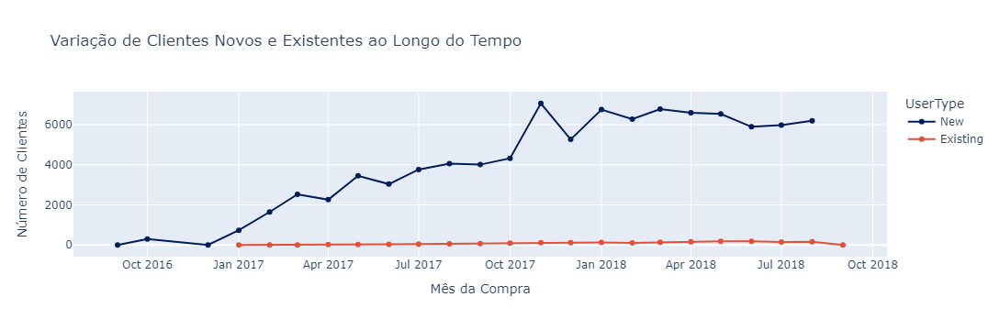

In [ ]:
# Passo 1: Converter 'InvoiceYearMonth' para string
orders['InvoiceYearMonth'] = orders['InvoiceYearMonth'].astype(str)

# Passo 2: Agrupar os dados por mês e tipo de cliente (New ou Existing)
customer_counts = orders.groupby(['InvoiceYearMonth', 'UserType'])['customer_unique_id'].nunique().reset_index()

# Passo 3: Criar o gráfico com Plotly
fig = px.line(customer_counts,
              x='InvoiceYearMonth',
              y='customer_unique_id',
              color='UserType',
              title='Variação de Clientes Novos e Existentes ao Longo do Tempo',
              labels={'InvoiceYearMonth': 'Mês da Compra', 'customer_unique_id': 'Número de Clientes'},
              markers=True)

# Passo 4: Exibir o gráfico
fig.show()

fig.write_image('C:/Users/Rubeus/Documents/tcc/images/fig_novos.png', width=1200, height=600, scale=3)

In [ ]:
orders.UserType.value_counts()

UserType
New         113109
Existing      2500
Name: count, dtype: int64

In [ ]:
import pandas as pd

# Passo 1: Agrupar os dados por mês e tipo de cliente (New ou Existing)
customer_counts = orders.groupby(['InvoiceYearMonth', 'UserType'])['customer_unique_id'].nunique().reset_index()

# Passo 2: Exibir a tabela no formato pandas
print(customer_counts)

# Passo 3: Exibir os resultados como texto formatado (opcional)
text_result = customer_counts.to_string(index=False)
print("\nTabela de Resultados em Texto:\n")
print(text_result)

   InvoiceYearMonth  UserType  customer_unique_id
0           2016-09       New                   2
1           2016-10       New                 298
2           2016-12       New                   1
3           2017-01  Existing                   1
4           2017-01       New                 734
5           2017-02  Existing                   3
6           2017-02       New                1645
7           2017-03  Existing                   6
8           2017-03       New                2527
9           2017-04  Existing                  20
10          2017-04       New                2259
11          2017-05  Existing                  27
12          2017-05       New                3447
13          2017-06  Existing                  39
14          2017-06       New                3035
15          2017-07  Existing                  50
16          2017-07       New                3762
17          2017-08  Existing                  61
18          2017-08       New                4058


* O número de novos clientes cresceu continuamente de janeiro a novembro de 2017, o que também levou a um aumento no número de pedidos mensais.

* A taxa de crescimento dos clientes recorrentes é quase nula, com transações de clientes recorrentes também baixas, **indicando uma alta taxa de churn de clientes**. Esse é um sinal crucial para o negócio, pois sugere que os clientes não estão dispostos a retornar à plataforma, o que pode resultar em perda de negócios no longo prazo.